<a href="https://colab.research.google.com/github/Murcha1990/ML_AI24/blob/main/Hometasks/Pro/AI_HW1_Regression_with_inference_pro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашнее задание №1 (pro)**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;
* реализовать веб-сервис для применения построенной модели на новых данных

> Оценка за домашку = $min(\text{ваш балл}, 11)$

**Мягкий дедлайн: 27 ноября 23:59**

**Жесткий дедлайн: 20 декабря 23:59 (конец модуля)**



**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns

random.seed(42)
np.random.seed(42)

### **Задание 0**
Для чего фиксируем сиды в домашках?

Чтобы результаты были воспроизводимые

# **Часть 1 | EDA**


Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (1.7 балла)
- Визуализации признаков и их анализ (1.6 балл)

Всего можно набрать 3.3 основных балла и 0.25 бонусных.

В следующих частях, вы увидите бонусные задания. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (1.7 балла)**

In [2]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1.(0.4 балла)**
Выполните операции, направленные на базовое исследование данных:

- [ ] Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла) DONE
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла) DONE
- [ ] Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла) DONE
- [ ] Опишите базовые выводы (какие — выберите сами), используя дашборд (0.2 балла) DONE

In [3]:
# Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
df_train.isna().sum()

name               0
year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
mileage          202
engine           202
max_power        196
torque           203
seats            202
dtype: int64

In [4]:
df_test.isna().sum()

name              0
year              0
selling_price     0
km_driven         0
fuel              0
seller_type       0
transmission      0
owner             0
mileage          19
engine           19
max_power        19
torque           19
seats            19
dtype: int64

In [5]:
# Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
print(f'There are {df_train.shape[0] - df_train.drop_duplicates().shape[0]} row duplicates in train')
print(f'There are {df_test.shape[0] - df_test.drop_duplicates().shape[0]} row duplicates in test')

There are 985 row duplicates in train
There are 62 row duplicates in test


In [6]:
# df_test = df_test.dropna()
# print(df_test.shape)
# df_train = df_train.dropna()
# print(df_train.shape)

In [7]:
# df_test = df_test.drop_duplicates()
# print(df_test.shape)
# df_train = df_train.drop_duplicates()
# print(df_train.shape)

In [6]:
# Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)

from ydata_profiling import ProfileReport

profile = ProfileReport(df_train, title="Profiling Report")

In [9]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Analytics (taken from the profiling report)

# Dataset has 493 (7.0%) duplicate rows
# km_driven is highly overall correlated with year
# selling_price is highly overall correlated with transmission and 1 other fields
# transmission is highly overall correlated with selling_price
# year is highly overall correlated with km_driven and 1 other fields
# seller_type is highly imbalanced (51.8%)
# mileage has 202 (2.9%) missing values
# engine has 202 (2.9%) missing values
# max_power has 196 (2.8%) missing values
# torque has 203 (2.9%) missing values
# seats has 202 (2.9%) missing values


### **Задание 2 (0.2 балла)**
Проанализируйте статистики датасета.

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста DONE
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста DONE
- [ ] Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты? DONE

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

In [7]:
# Посчитайте основные статистики по числовым столбцам для трейна и теста

df_train.describe()

,year,selling_price,km_driven,seats
count,6999.000000,6.999000e+03,6.999000e+03,6797.000000
mean,2013.818403,6.395152e+05,6.958462e+04,5.419008
std,4.053095,8.089419e+05,5.772400e+04,0.965767
min,1983.000000,2.999900e+04,1.000000e+00,2.000000
25%,2011.000000,2.549990e+05,3.500000e+04,5.000000
50%,2015.000000,4.500000e+05,6.000000e+04,5.000000
75%,2017.000000,6.750000e+05,9.700000e+04,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,14.000000


In [8]:
# Посчитайте основные статистики по категориальным столбцам для трейна и теста
df_train.describe(include='object')

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,6999,6999,6999,6999,6999,6797,6797,6803,6796
unique,1924,4,3,2,5,386,120,316,419
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm
freq,116,3793,5826,6095,4587,197,885,330,468


In [9]:
# Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты?
df_train.select_dtypes(include='number').mean()

year               2013.818403
selling_price    639515.197171
km_driven         69584.615517
seats                 5.419008
dtype: float64

In [10]:
df_train.select_dtypes(include='number').median()

year               2015.0
selling_price    450000.0
km_driven         60000.0
seats                 5.0
dtype: float64

In [11]:
df_test.select_dtypes(include='number').mean()

year               2013.681000
selling_price    617901.042000
km_driven         71393.341000
seats                 5.410805
dtype: float64

In [12]:
df_train.select_dtypes(include='number').median()

year               2015.0
selling_price    450000.0
km_driven         60000.0
seats                 5.0
dtype: float64

In [13]:
# The mean and medians are pretty close, so it does not seem the the destributions of train and test are that different.

### **Задание 3 (0.2 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.05 балла) DONE
- [ ] Отобразите такие объекты (0.05 балла)  DONE
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.05 балла) DONE
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.05 балла) DONE

In [14]:
# Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.05 балла)
print(f"There are {df_train.shape[0] - df_train.drop(columns=['selling_price']).drop_duplicates().shape[0]} observations that have at least one matching observation with the same features, but dirrerent price.")

There are 1159 observations that have at least one matching observation with the same features, but dirrerent price.


In [15]:
df_train[df_train.drop(columns=['selling_price']).duplicated()]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
254,Hyundai Grand i10 Sportz,2017,450000,35000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,82 bhp,114Nm@ 4000rpm,5.0
258,Maruti Swift VXI,2012,330000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
268,Maruti Swift Dzire VXI,2014,400000,70000,Petrol,Individual,Manual,Second Owner,19.1 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,2625000,9000,Diesel,Dealer,Automatic,First Owner,13.6 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.0
325,Lexus ES 300h,2019,5150000,20000,Petrol,Dealer,Automatic,First Owner,22.37 kmpl,2487 CC,214.56 bhp,202Nm@ 3600-5200rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6947,Chevrolet Spark 1.0 LS,2010,140000,60000,Petrol,Individual,Manual,Second Owner,18.0 kmpl,995 CC,62 bhp,90.3Nm@ 4200rpm,5.0
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,746000,24000,Diesel,Individual,Manual,First Owner,24.4 kmpl,1498 CC,98.63 bhp,215Nm@ 1750-3000rpm,5.0
6989,Maruti Swift Dzire VDI,2015,625000,50000,Diesel,Individual,Manual,First Owner,26.59 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


In [16]:
# Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.05 балла)
# Default behavior for dropduplicates is "keep_first" == True
idx = df_train.drop(columns=['selling_price']).drop_duplicates().index
df_train = df_train.loc[list(idx)]
print(df_train.shape)

(5840, 13)


In [17]:
# Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.05 балла)

df_train = df_train.reset_index(drop=True)
df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92 kmpl,1086 CC,62.1 bhp,96.1Nm@ 3000rpm,5.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.9 kmpl,998 CC,67.1 bhp,90Nm@ 3500rpm,5.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0


### **Задание 4 (0.3 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``. DONE
* [ ] Приведите тип данных к ``float``. DONE
* [ ] Предобработайте признак `torque` — разделите его на два: собственно `torque` и `max_torque_rpm`. Учтите единицы измерения DONNE


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.

In [18]:
df_train.dtypes

name              object
year               int64
selling_price      int64
km_driven          int64
fuel              object
seller_type       object
transmission      object
owner             object
mileage           object
engine            object
max_power         object
torque            object
seats            float64
dtype: object

In [19]:
# # your code here
df_train.mileage = df_train.mileage.apply(lambda x: float(x.split(' ')[0]) if type(x) != float else x)
df_train.engine = df_train.engine.apply(lambda x: float(x.split(' ')[0]) if type(x) != float else x)

In [20]:
def max_pow_filter(x):
    try:
        return float(x.split(' ')[0])
    except:
        return 0

In [21]:
df_train.max_power = df_train.max_power.apply(max_pow_filter)

In [22]:
df_test.mileage = df_test.mileage.apply(lambda x: float(x.split(' ')[0]) if type(x) != float else x)
df_test.engine = df_test.engine.apply(lambda x: float(x.split(' ')[0]) if type(x) != float else x)

In [23]:
df_test.max_power = df_test.max_power.apply(max_pow_filter)

In [24]:
df_train.torque

0                  190Nm@ 2000rpm
1             250Nm@ 1500-2500rpm
2        22.4 kgm at 1750-2750rpm
3           11.5@ 4,500(kgm@ rpm)
4               113.75nm@ 4000rpm
                  ...            
5835              96.1Nm@ 3000rpm
5836                90Nm@ 3500rpm
5837             113.7Nm@ 4000rpm
5838    24@ 1,900-2,750(kgm@ rpm)
5839               190Nm@ 2000rpm
Name: torque, Length: 5840, dtype: object

In [25]:
import pandas as pd
import re
import numpy as np

def convert_kgm_to_nm(kgm_value):
    return kgm_value * 9.81

def filter_torque(df, min_torque=None, max_torque=None):
    def parse_torque(torque_str):
        if pd.isna(torque_str):
            return None, None, None
        
        torque_str = str(torque_str).strip()

        pattern = r"(\d+\.?\d*)\s*(Nm|kgm)\s*(?:@|\sat)\s*(\d+(-\d+)?)rpm"
        match = re.match(pattern, torque_str)
        
        if match:
            torque_value = float(match.group(1))
            unit = match.group(2)
            rpm_str = match.group(3)
            
            if unit == 'kgm':
                torque_value = convert_kgm_to_nm(torque_value)
            
            rpm_values = rpm_str.split('-')
            if len(rpm_values) == 1:
                rpm_min = rpm_max = int(rpm_values[0])
            else:
                rpm_min = int(rpm_values[0])
                rpm_max = int(rpm_values[1])
            
            return torque_value, rpm_min, rpm_max
        return None, None, None


    df['torque'], df['parsed_rpm_min'], df['max_torque_rpm'] = zip(*df['torque'].apply(parse_torque))
    
    return df

In [26]:
df_train = filter_torque(df_train, min_torque=150)
df_train = df_train.drop(columns=["parsed_rpm_min"])
df_train.shape

(5840, 14)

In [27]:
df_test= filter_torque(df_test, min_torque=150)
df_test = df_test.drop(columns=["parsed_rpm_min"])
df_test.shape

(1000, 14)

### **Задание 5 (0.3 балла)**

На первом шаге мы обнаружили пропуски. Давайте избавимся от них.

**Задание:**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось. DONE
- [ ] Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение. DONE
- [ ] Как правильно считать медиану для заполнения? Выберите верное утверждение: DONE
 - По тестовым свою, по тренировочным — свою
 - По тренировочным данным для `train` и `test`  - Правильный ответ

In [28]:
# your code here
num_cols = df_train.select_dtypes(include=np.number).columns

In [29]:
num_cols

Index(['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power',
       'torque', 'seats', 'max_torque_rpm'],
      dtype='object')

In [30]:
df_train.loc[:,num_cols] = df_train.loc[:,num_cols].fillna(df_train.loc[:,num_cols].median())

In [31]:
df_test.loc[:,num_cols] = df_test.loc[:,num_cols].fillna(df_train.loc[:,num_cols].median())

In [32]:
df_train = df_train.drop(columns=["torque"])

In [33]:
df_test = df_test.drop(columns=["torque"])

In [34]:
df_train.isna().sum()

name              0
year              0
selling_price     0
km_driven         0
fuel              0
seller_type       0
transmission      0
owner             0
mileage           0
engine            0
max_power         0
seats             0
max_torque_rpm    0
dtype: int64

### **Задание 6 (0.2 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу. DONE
- [ ] Ответье на вопрос — почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную? DONE

In [35]:
df_train.engine = df_train.engine.apply(int)
df_train.seats = df_train.seats.apply(int)
df_test.engine = df_test.engine.apply(int)
df_test.seats = df_test.seats.apply(int)

In [36]:
df_test.seats.value_counts()

seats
5    777
7    161
4     24
8     23
6      8
9      7
Name: count, dtype: int64

Since there are only 6 different types of seat configurations, we could view it as a categorical feature

### **Задание 7 (0.1 балла)**

Снова вызовите метод describe и проанализируйте статистики.

**Ответье на вопрос:**
- [ ] Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть? DONE

In [37]:
df_train.describe()

,year,selling_price,km_driven,mileage,engine,max_power,seats,max_torque_rpm
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.00000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.430841,1429.448973,85.32722,5.426712,3026.336986
std,4.095622,5.354320e+05,6.007114e+04,3.985973,485.662834,35.16849,0.982344,832.423380
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,0.00000,2.000000,1400.000000
25%,2011.000000,2.500000e+05,3.900000e+04,16.950000,1197.000000,67.05000,5.000000,2500.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.370000,1248.000000,81.80000,5.000000,3000.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.300000,1498.000000,99.00000,5.000000,3500.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.00000,14.000000,5300.000000


No, since  we replaced the missing  values with median (does not affect the expected value)

## **Визуализации и корреляция (1.6 балла + 0.25)**

Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 8 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train` DONE
- [ ] По полученному графику ответьте на вопросы: DONE
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
    Yes, there seem to be relations between selling price and features  (for instance newer cars are more expensive, while cars with high milage tend to lose value).
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?
    There do not seem to be any evident correlations between features (at first glance).

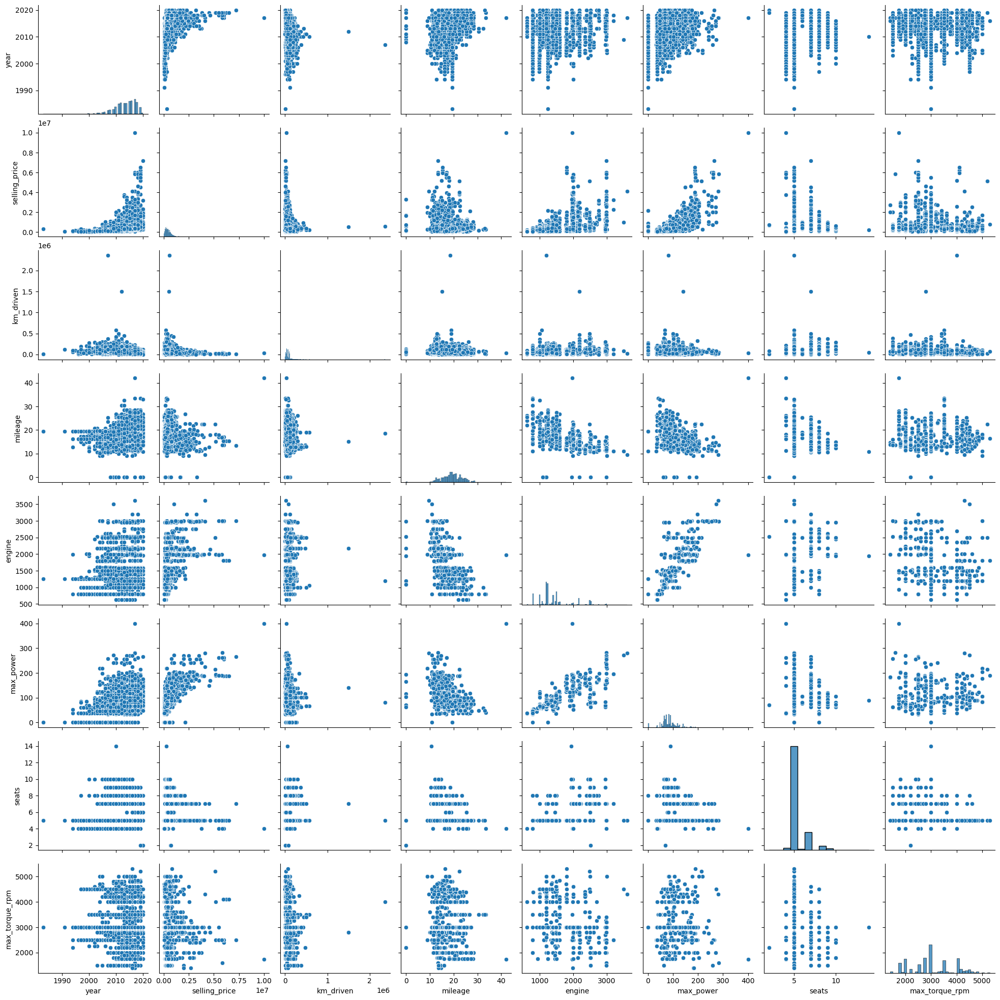

In [46]:
%matplotlib inline
import seaborn as sns
sns.pairplot(df_train)
plt.show()

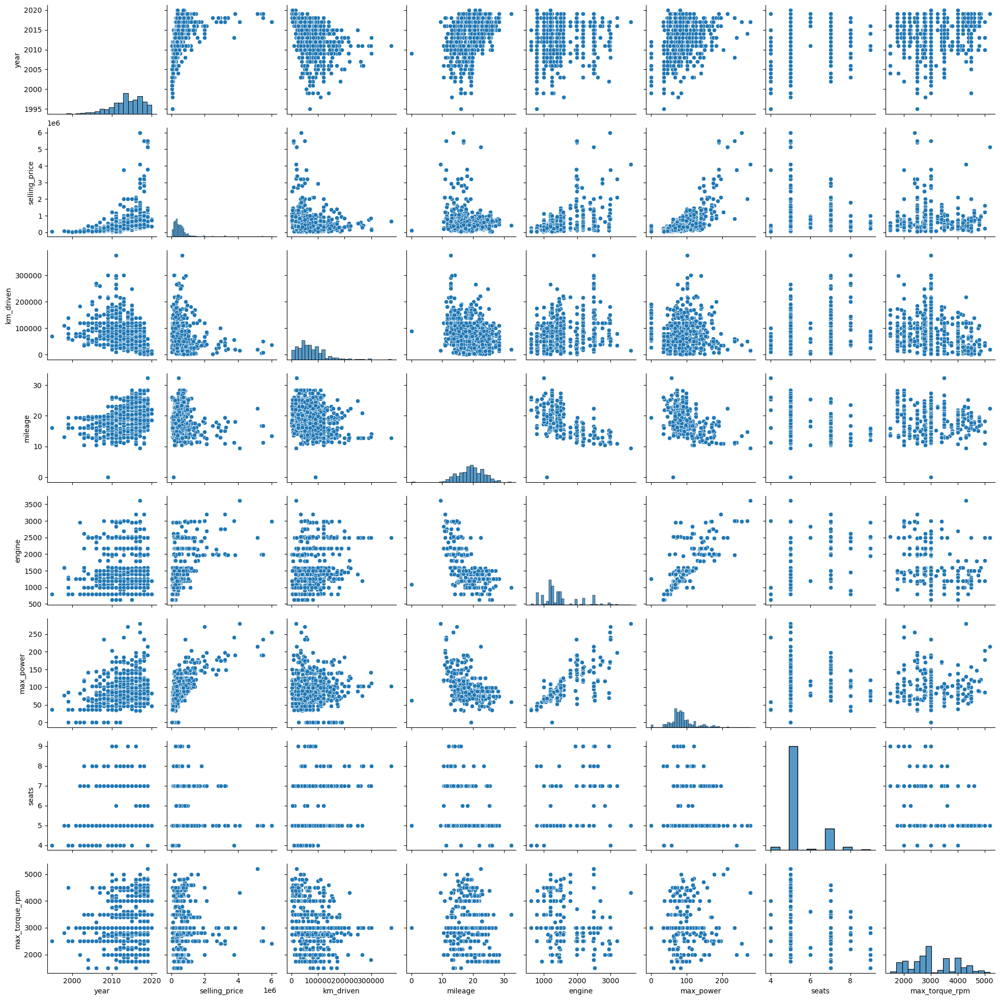

In [45]:
%matplotlib inline
import seaborn as sns
sns.pairplot(df_test)
plt.show()

Шаг 2.

- [ ] Постройте pairplot по тестовым данным DONE
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?" Yes, the do look simular.

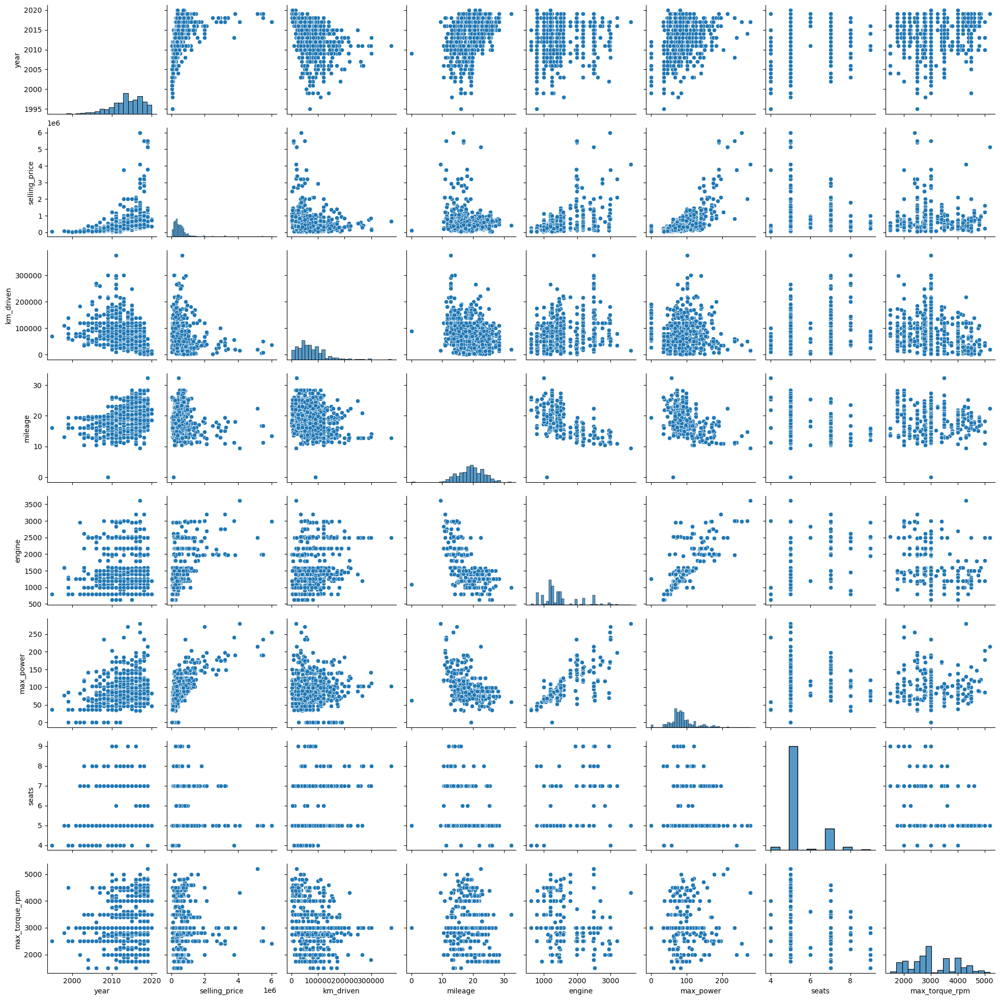

In [40]:
import seaborn as sns
sns.pairplot(df_test)

### **Задание 9 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()` DONE
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn) DONE

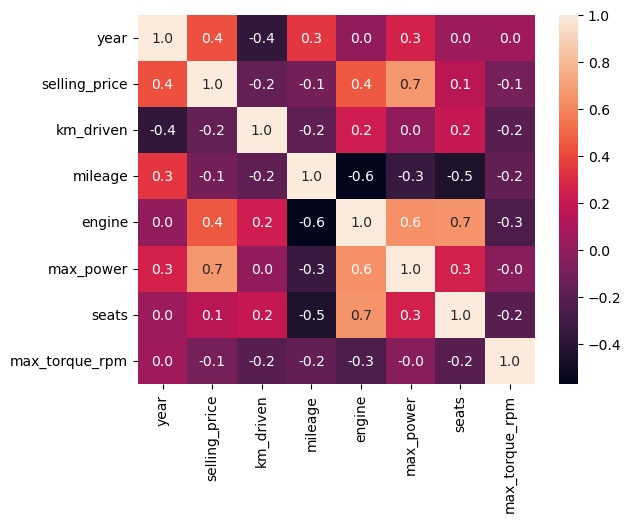

In [44]:
# your code here
%matplotlib inline
sns.heatmap(df_train.select_dtypes(include='number').corr(), annot=True, fmt='.1f')
plt.show()

- [ ] Ответьте на вопросы: DONE
 - Какие 2 признака наименее скоррелированы между собой?
    engine/year, max_power/max_torque_rpm, seats/year, km_driven/max_power
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
    engine and seasts.
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?
    No, since  the realtionship could be non-linear.

### **Задание 10 (0.6 балла)**

По умолчанию `pd.corr` возвращает корреляцию Пирсона, говорящую о линейной взаимосвязи. Но зависимости существуют не только линейные! В этой задаче, попробуйте измерить другие способы вычисления корреляций.

- [ ] Реализуйте корреляцию Спирмена/Кендала (на выбор) без использования библиотек (можно пользоваться только `numpy`). Сравните результаты вычисления с библиотечной реализацией DONE
- [ ]

Постройте матрицу корреляции [phik](https://pypi.org/project/phik/)
- [ ] Проинтерпретируйте результаты


In [38]:
def calc_sp_corr(x, y):
    x_ranks = (-x).argsort().argsort()
    y_ranks = (-y).argsort().argsort()
    n = len(x)

    d = x_ranks - y_ranks
    d_2 = d**2

    coeff = 1 - (6*d_2.sum())/(n*(n**2 - 1))
    return coeff

In [39]:
df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,max_torque_rpm
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,5,2000.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,5,2500.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,5,2750.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,5,3000.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197,81.86,5,3000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92,1086,62.10,5,3000.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.90,998,67.10,5,3500.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197,82.85,5,4000.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493,110.00,5,3000.0


In [40]:
calc_sp_corr(df_train.mileage, df_train.engine)

-0.4293012604080413

In [41]:
from scipy import stats
stats.spearmanr(df_train.mileage, df_train.engine).statistic

-0.42987101474114714

interval columns not set, guessing: ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'seats', 'max_torque_rpm']


/Users/macbookpro/opt/anaconda3/lib/python3.9/site-packages/phik/data_quality.py:59: UserWarning: The number of unique values of variable name is large: 1924. Are you sure this is not an interval variable? Analysis for pairs of variables including name can be slow.
  warnings.warn(
/Users/macbookpro/opt/anaconda3/lib/python3.9/site-packages/phik/phik.py:319: RuntimeWarning: invalid value encountered in sqrt
  global_correlations = np.sqrt(
/Users/macbookpro/opt/anaconda3/lib/python3.9/site-packages/phik/outliers.py:200: RuntimeWarning: invalid value encountered in scalar subtract
  logmidp = np.log(0.5) + lp + np.log(1 + np.exp(lp1 - lp))
/Users/macbookpro/opt/anaconda3/lib/python3.9/site-packages/phik/outliers.py:200: RuntimeWarning: invalid value encountered in scalar subtract
  logmidp = np.log(0.5) + lp + np.log(1 + np.exp(lp1 - lp))
/Users/macbookpro/opt/anaconda3/lib/python3.9/site-packages/phik/outliers.py:200: RuntimeWarning: invalid value encountered in scalar subtract
  logmi

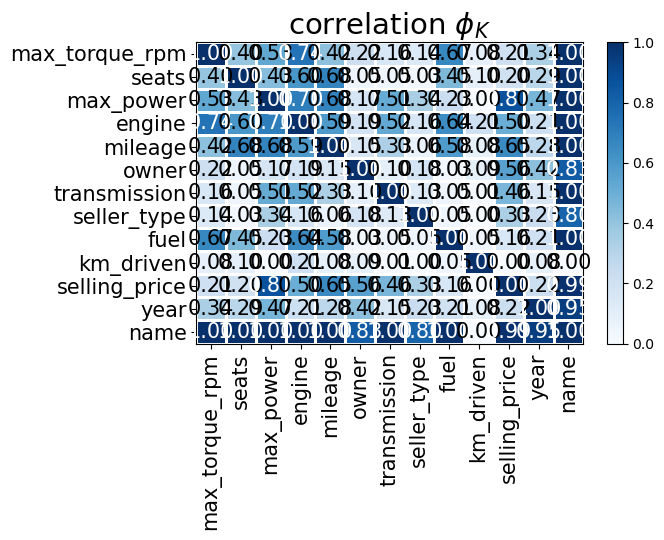

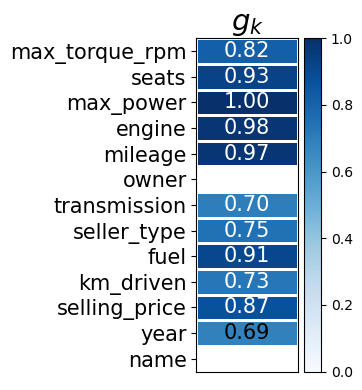

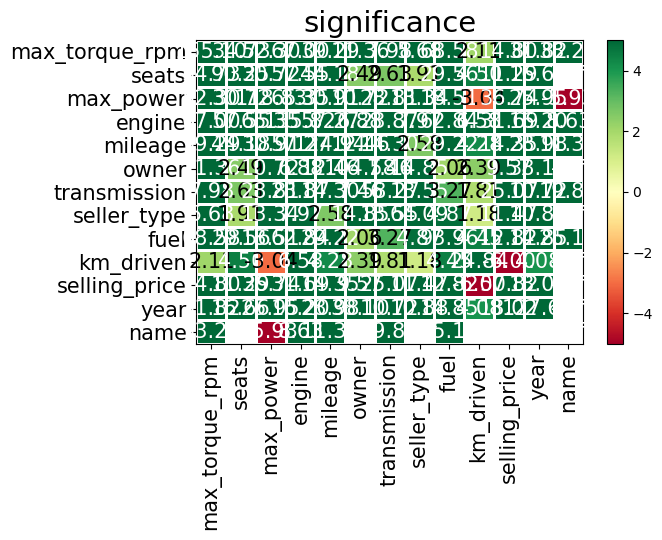

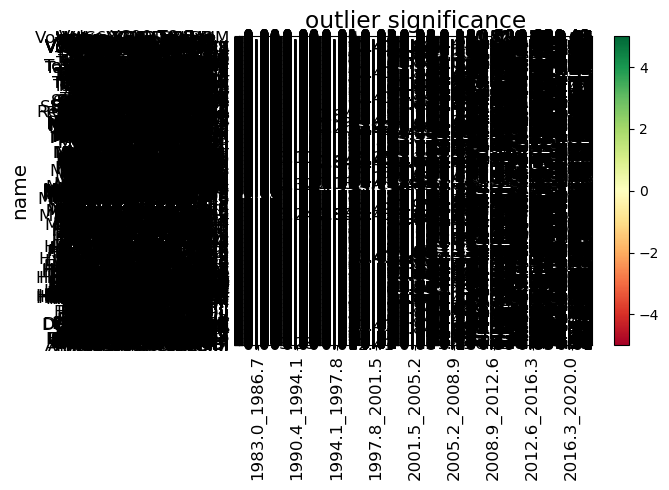

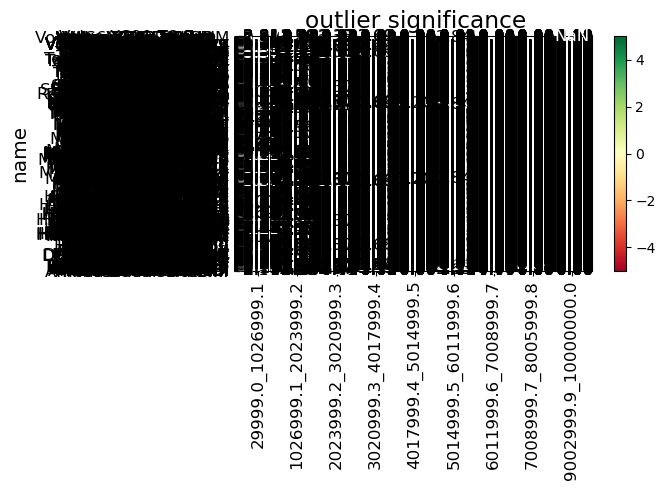

...

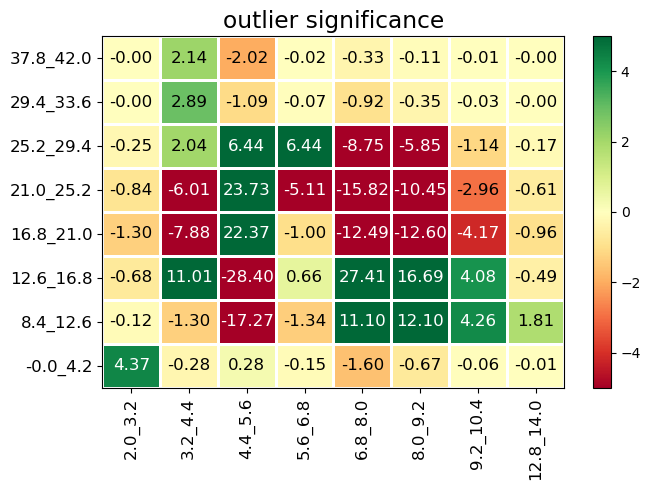

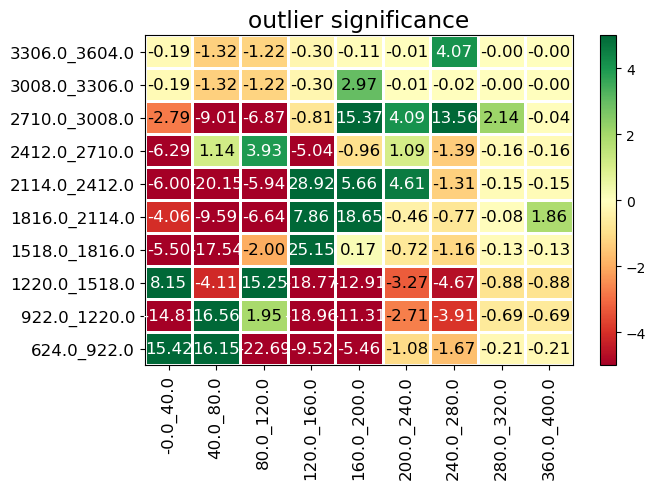

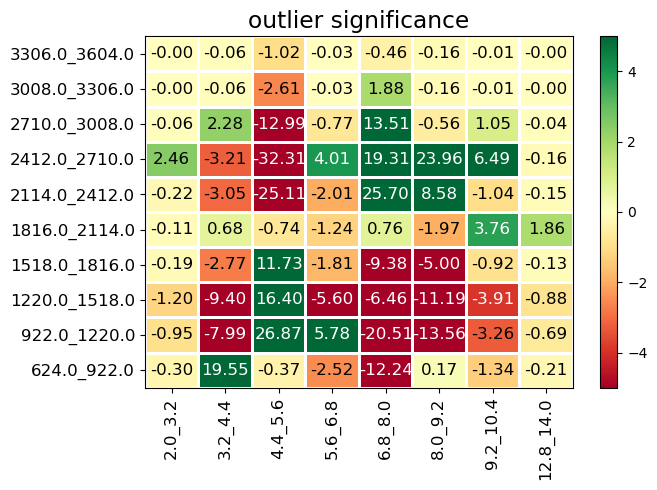

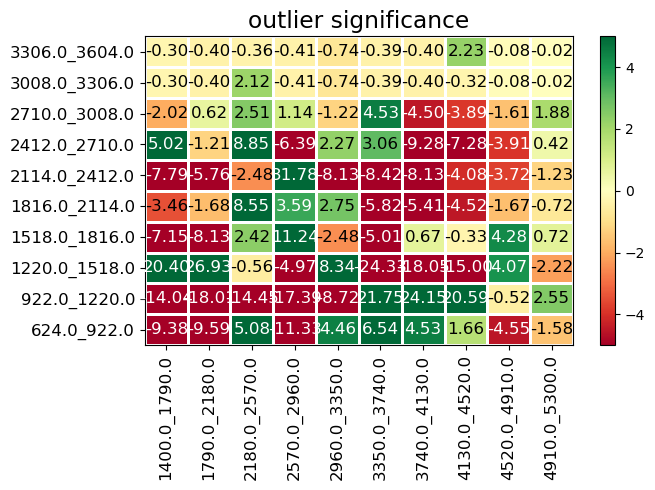

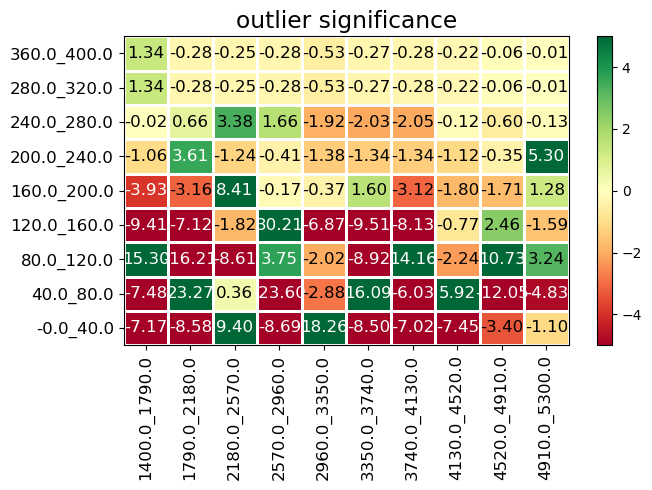

In [51]:
from phik import report

rep = report.correlation_report(df_train, significance_threshold=3, correlation_threshold=0.5)

In [52]:
# The output look horrible)

### **Дополнительные визуализации (бонус 0.2 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.

In [46]:
# your code here

# **Часть 2 (1.7 балла) | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.7 основных и 0.15 бонусных балла;

### **Задание 11 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [42]:
y_train = df_train.selling_price
X_train = df_train.select_dtypes(include='number').drop(columns="selling_price")

In [43]:
assert X_train.shape == (5840, 7)

In [44]:
y_test = df_test.selling_price
X_test = df_test.select_dtypes(include='number').drop(columns="selling_price")

In [45]:
assert X_test.shape == (1000, 7)

### **Задание 12. (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста. DONE
- [ ] Сделайте выводы по значениям метрик качества. DONE

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [46]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

reg = LinearRegression().fit(X_train, y_train)

In [47]:
r2_score(y_test, reg.predict(X_test))

0.5498492950759288

In [48]:
MSE(y_test, reg.predict(X_test))

258759479531.13144

The model is mediocre

### **Задание 13 (0.15 балла)**

- [ ] Реализуйте $R^2$ руками. Приведите формулу $R^2$ и объясните каждую компоненту метрики DONE

In [49]:
def r_2_manual(y, preds):
    ssr = sum((y - preds)**2)  # sum of residuals squared
    tss = sum((y - y.mean())**2) # the sum of the distance the data is away from the mean all squared

    return 1 - ssr/tss

In [50]:
r_2_manual(y_test, reg.predict(X_test))

0.5498492950759284

### **Бонус (0.15 балла)**

- [ ] Реализуйте [$\text{adjusted}-R^2$](https://en.wikipedia.org/wiki/Coefficient_of_determination).  DONE
- [ ] Объясните, когда применяется $\text{adjusted}-R^2$? DONE

In [51]:
def r2_adj(y, preds, k):
    r2 = r_2_manual(y, preds)
    n = y.shape[0]
    return (1-r2)*(n-1)/(n-k-1)

In [52]:
r2_adj(y_test, reg.predict(X_test), reg.coef_.shape[0])

0.45332717159188257

In [53]:
# R2 Adj penalizes complicated models (more coeffs) that have insignificant features, while R2 never decreases in case of adding meaningless variables.

### **Задание 14 (0.05 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**. DONE

In [54]:
from sklearn.preprocessing import StandardScaler

transfromer = StandardScaler()

X_train = transfromer.fit_transform(X_train)
X_test = transfromer.transform(X_test)

In [55]:
reg = LinearRegression().fit(X_train, y_train)

In [56]:
r2_score(y_test, reg.predict(X_test))

0.5498492950759486

### **Задание 15 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены? DONE

In [57]:
cols= df_test.select_dtypes(include='number').drop(columns="selling_price").columns

In [58]:
abs(reg.coef_)

array([1.46710199e+05, 5.84616701e+04, 1.48842343e+02, 1.20349531e+05,
       2.56430404e+05, 6.67058010e+04, 4.51901308e+04])

In [59]:
sorted(abs(reg.coef_))

[148.84234345672303,
 45190.130831353126,
 58461.67011630369,
 66705.80101386382,
 120349.53104235603,
 146710.1987814291,
 256430.40368028803]

In [60]:
cols

Index(['year', 'km_driven', 'mileage', 'engine', 'max_power', 'seats',
       'max_torque_rpm'],
      dtype='object')

In [61]:
{k:v for k,v in zip(cols, abs(reg.coef_))}

{'year': 146710.1987814291,
 'km_driven': 58461.67011630369,
 'mileage': 148.84234345672303,
 'engine': 120349.53104235603,
 'max_power': 256430.40368028803,
 'seats': 66705.80101386382,
 'max_torque_rpm': 45190.130831353126}

In [62]:
sorted({k:v for k,v in zip(cols, abs(reg.coef_))}, key=lambda item: item[1], reverse=True)

['engine',
 'km_driven',
 'mileage',
 'year',
 'seats',
 'max_power',
 'max_torque_rpm']

### **Задание 16 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество DONE
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему. DONE

In [63]:
from sklearn.linear_model import Lasso

lasso_model = Lasso().fit(X_train, y_train)

In [64]:
r2_score(y_test, lasso_model.predict(X_test))

0.549847927186462

In [65]:
lasso_model.coef_

array([ 1.46708041e+05, -5.84607299e+04, -1.45767696e+02,  1.20347472e+05,
        2.56431416e+05, -6.67019799e+04, -4.51879858e+04])

In [66]:
reg.coef_

array([ 1.46710199e+05, -5.84616701e+04, -1.48842343e+02,  1.20349531e+05,
        2.56430404e+05, -6.67058010e+04, -4.51901308e+04])

In [67]:
# None of the coeffs are zeroed out, hence all are considered more or less important by the model

### **Задание 17. Финальный рывок (0.4 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html). DONE
- [ ] Ответьте на вопросы: DONE
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? Опишите каждый
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [68]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import ElasticNet
elastic_model = ElasticNet()
parametersGrid = {"max_iter": [1, 5, 10],
                    "alpha": [0.0001*10**i for i in range(1, 8)],
                    "l1_ratio": np.arange(0.0, 1.0, 0.1),
                    "tol": [0.0001*10**i for i in range(1, 5)]}
grid = GridSearchCV(elastic_model, parametersGrid, scoring='r2', cv=10)

In [69]:
grid.fit(X_train, y_train)

/Users/macbookpro/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.098e+14, tolerance: 1.247e+12 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/Users/macbookpro/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.996e+14, tolerance: 1.564e+12 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the so

GridSearchCV(cv=10, estimator=ElasticNet(),
             param_grid={'alpha': [0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0],
                         'l1_ratio': array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
                         'max_iter': [1, 5, 10],
                         'tol': [0.001, 0.01, 0.1, 1.0]},
             scoring='r2')

In [70]:
r2_score(y_test, grid.predict(X_test))

0.5089359140368648

In [71]:
grid.best_estimator_.coef_

array([129735.38407224, -53897.94905092,    745.43831879, 106353.82290565,
       219358.95304513, -38280.0711059 , -35120.67289389])

In [72]:
grid.best_estimator_.coef_ 

array([129735.38407224, -53897.94905092,    745.43831879, 106353.82290565,
       219358.95304513, -38280.0711059 , -35120.67289389])

None of the coeffs got zeroed out.

In [73]:
grid.best_score_

0.5277517075851581

In [74]:
print(f"The grid search fitted {pd.DataFrame(grid.cv_results_).shape[0]} models")

The grid search fitted 840 models


In [75]:
parametersGrid = {"max_iter": [1, 5, 10],
                    "alpha": [0.0001*10**i for i in range(1, 8)],
                    "l1_ratio": np.arange(0.0, 1.0, 0.1),
                    "tol": [0.0001*10**i for i in range(1, 5)]}

From sklearn docs:

- max_iter - The maximum number of iterations.
-  alpha - List of alphas where to compute the models. If None alphas are set automatically.
- l1_ratio - Number between 0 and 1 passed to elastic net (scaling between l1 and l2 penalties). l1_ratio=1 corresponds to the Lasso.
- tol - The tolerance for the optimization: if the updates are smaller than tol, the optimization code checks the dual gap for optimality and continues until it is smaller than tol.

### **Задание 18 (0.35 балла)** TODO

И так, вы обучили все варианты регуляризаций, доступные в sklearn, но не все, что мы обсудили на занятии! И следующее задание о забытой - $L0$ регуляризации.


**Ваша задача:**>
- [ ] Реализуйте модель с $L0$-регуляризаицей.
- [ ] Обучите модель на данных и проанализируйте результат, экспериментируя с коэффициенитом регуляризации
- [ ] Проанализируйте результаты обучения

**Важно:**

Вопреки тому, что L0 не реализована в стандартных пакетах, концепция данной регуляризации не является мертвой. Она может встречаться в [статьях](https://arxiv.org/abs/1712.01312) и экспериментах.



# **Часть 3 (0.5 балла) | Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.5 основных балла.



### **Задание 19 (0.1 балла)**

Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

- [ ] Предобработайте столбец `name`, чтобы избежать его удаления DONE

In [76]:
df_train.name.unique().shape

(1924,)

In [77]:
df_train.name

0                  Maruti Swift Dzire VDI
1            Skoda Rapid 1.5 TDI Ambition
2               Hyundai i20 Sportz Diesel
3                  Maruti Swift VXI BSIII
4           Hyundai Xcent 1.2 VTVT E Plus
                      ...                
5835              Hyundai Santro Xing GLS
5836    Maruti Wagon R VXI BS IV with ABS
5837                    Hyundai i20 Magna
5838                Hyundai Verna CRDi SX
5839               Maruti Swift Dzire ZDi
Name: name, Length: 5840, dtype: object

In [85]:
# Lets only keep the brand name

In [78]:
df_train.name.apply(lambda x: x.split(' ')[0]).unique().shape

(30,)

In [79]:
df_train.name = df_train.name.apply(lambda x: x.split(' ')[0])

In [80]:
df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,max_torque_rpm
0,Maruti,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,5,2000.0
1,Skoda,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,5,2500.0
2,Hyundai,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,5,2750.0
3,Maruti,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,5,3000.0
4,Hyundai,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197,81.86,5,3000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92,1086,62.10,5,3000.0
5836,Maruti,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.90,998,67.10,5,3500.0
5837,Hyundai,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197,82.85,5,4000.0
5838,Hyundai,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493,110.00,5,3000.0


In [81]:
df_train.describe(include='object')

,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,30,4,3,2,5
top,Maruti,Diesel,Individual,Manual,First Owner
freq,1804,3177,5223,5336,3603


### **Задание 20 (0.1 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования. DONE

In [82]:
from sklearn.preprocessing import OneHotEncoder # или можно использовать get_dummies из библиотеки pandas

# Since the task did not state that I need to encode other categorical features, I am only going to encode the 'seats' column

df_train_cat = pd.get_dummies(df_train.drop(columns='selling_price'),columns=['seats'])
df_test_cat = pd.get_dummies(df_test.drop(columns='selling_price'),columns=['seats'])

### **Задание 21 (0.2 балла)**

OHE — базовый алгоритм преобразования категориальных признаков, но и с ним нужно быть аккуратными.

**Ответьте на вопросы:**


* Как корректно работать с OHE преобразованием? By encoding the categotical values) DONE
* Почему мы удаляем один столбец? To avoid the dummy variable trap - it leads to multicollinearity. DONE
* Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить? Yes, unless there is a reason to think that test data distribution
is different from the distribution of train data (which is usually not the case). DONE

### **Задание 22 (0.1 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам. DONE
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов? The score did not really improve

In [83]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

parametersGrid = {"alpha": [0.0001*10**i for i in range(1, 8)]}

grid = GridSearchCV(Ridge(), parametersGrid, scoring='r2', cv=10)

In [84]:
grid.fit(df_train_cat.select_dtypes('number'), y_train)

GridSearchCV(cv=10, estimator=Ridge(),
             param_grid={'alpha': [0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0]},
             scoring='r2')

In [85]:
grid.best_score_

0.5061448783246939

In [86]:
r2_score(y_test, grid.predict(df_test_cat.select_dtypes('number')))

0.536786129270418

# **Часть 4 - бонусная (1 балл) | Feature Engineering**

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 2-х баллов в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
    * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
    * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
    * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
    * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
    * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
    * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
    * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
    * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

In [ ]:
# your code here

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 23 (0.25 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric` DONE
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса DONE (I named the models the same and I do not want to relaunch the notebook))))

In [87]:
def business_metrics(y_true, y_pred):
    return (abs(1-y_pred/y_true)<=0.1).sum()

business_metrics(y_test, grid.predict(df_test_cat.select_dtypes('number')))

260

### **Задание 24 (0.25 балла)**

Но у бизнеса не всегда есть идеи и иногда задача на выбор метрики делегируется вам.

**Задание:**

- [ ] Придумайте и реализуйте другую кастомную метрику с учетом того, что модель не должна сильно ошибаться в прогнозе, но недопрогноз для модели, согласно мнению бизнеса, хуже, чем перепрогноз. DONE
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса DONE



In [88]:
def business_metrics(y_true, y_pred):
    val =  ((1-y_pred/y_true)<=0.1) & ((1-y_pred/y_true) >= -0.05)
    return val.sum()

business_metrics(y_test, grid.predict(df_test_cat.select_dtypes('number')))

207

# **Часть 5 (3 балла) | Реализация сервиса на FastAPI**

### **Задание 25**

Cделайте с помощью FastAPI сервис, который с точки зрения пользователя реализует две функции:

1. на вход в формате json подаются признаки одного объекта, на выходе сервис выдает предсказанную стоимость машины
2. на вход подается csv-файл с признаками тестовых объектов, на выходе получаем файл с +1 столбцом - предсказаниями на этих объектах

С точки зрения реализации это означает следующее:
- средствами pydantic должен быть описан класс базового объекта
- класс с коллецией объектов
- метод post, который получает на вход один объект описанного класса
- метод post, который получает на вход коллекцию объектов описанного класса

Шаблон для сервисной части дан ниже. Код необходимо дополнить и оформить в виде отдельного .py-файла.

In [154]:
reg

LinearRegression()

In [90]:
import pickle

pickle.dump(grid.best_estimator_, open('model.pkl', 'wb'))

In [89]:
grid.best_estimator_

Ridge(alpha=0.001)

In [152]:
from fastapi import FastAPI
from pydantic import BaseModel
from typing import List
from fastapi.encoders import jsonable_encoder
import pandas as pd
import joblib

app = FastAPI()

reg = joblib.load('model_final.joblib')

class Item(BaseModel):
    name: str
    year: int
    selling_price: int
    km_driven: int
    fuel: str
    seller_type: str
    transmission: str
    owner: str
    mileage: float
    engine: int
    max_power: float
    seats: float
    max_torque_rpm: float


class Items(BaseModel):
    objects: List[Item]

class ItemResponse(Item):
    prediction: float


def pydantic_model_to_df(model_instance):
    if type(model_instance) == list:
        frame = pd.DataFrame(jsonable_encoder(model_instance))
    else:
        frame = pd.DataFrame([jsonable_encoder(model_instance)])
    frame = frame.loc[:, ["year", "km_driven", "mileage", "engine", "max_power", "max_torque_rpm"]]
    return frame

@app.post("/predict_item")
def predict_item(item: Item) -> float:
    df_instance = pydantic_model_to_df(item)
    result = reg.predict(df_instance)
    return result


@app.post("/predict_items")
def predict_items(items: List[Item]) -> float:
    df_instance = pydantic_model_to_df(items)
    result = reg.predict(df_instance)
    return result

In [155]:
reg

LinearRegression()

Протестируйте сервис на корректность работы и приложите скриншоты (см. ниже).

# **Часть 6 (1 балл) | Оформление результатов**

### **Задание 26**

**Результаты вашей работы** необходимо разместить в своем Гитхабе. Под результатами понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* ``.py``-файл с реализацией сервиса
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)

**Как будет выглядет проверка всего домашнего задания?**
1. Ассистент проходит по ссылке на (**открытый**) репозиторий из Энитаска
2. Смотрит ``readme.md``:
    * пожалуйста, приложите в него же скрины работы вашего сервиса -- собирать ваши проекты довольно времязатратно, но хочется убедиться, что всё работает
    * можете в md-файл приложить ссылку на screencast с демонстрацией

3. Просматривает ноутбук с DS частью
4. Заглядывает в код сервиса
5. Хвалит

# **Часть Благодарственная**

Надеемся, вы честно проделали все пункты, а не просто пролистали досюда. Потому что здесь награда за старания. Пожалуйста, не стоит награждать себя до того, как закончите работать над домашкой.

<details>
<summary><b>Что-то приятное</b></summary>

**Напоминаем, что нашем курсе действует система кото-бонусов** 🐈

На фото по ссылке — сэр кот кого-то из команды курса (преподаватель, помощник преподавателя, ассистенты).

Предлагаем вам угадать — чей это товарищ!

[Первый кот](https://ibb.co/Kz1ZRWj)

</details>